In [1]:
import scipy
import matplotlib.pyplot as plt
import mne
from omegaconf import OmegaConf
import numpy as np
import pandas as pd
import glob
from pathlib import Path

from scipy.fft import fft , rfft , fftfreq , rfftfreq

from plotly import tools
import chart_studio.plotly as py
from plotly.graph_objs import Layout, Scatter, Figure, Marker, Annotations
from plotly.graph_objs.layout import YAxis, Font, Annotation
import plotly.offline as pyo
from autoreject import get_rejection_threshold
from scipy import stats
import nolds
import antropy as ant

from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn.model_selection import cross_val_score, StratifiedKFold
from xgboost import XGBClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

pyo.init_notebook_mode()
config = OmegaConf.load('../config/config.yaml')

# Functions

In [2]:
def rename_channels(data):
    """
    rename channels to remove 'EEG', '-A1' and '-A2'
    """
    ch_names_dict = {}
    for i in range(data.get_data().shape[0]):
        ch_name = data.info['chs'][i]['ch_name']
        ch_name_new = ch_name
        ch_name_new = ch_name_new.replace('EEG ', '')
        ch_name_new = ch_name_new.replace('-A1', '')
        ch_name_new = ch_name_new.replace('-A2', '')
        ch_names_dict[ch_name] = ch_name_new
    
    mne.rename_channels(data.info, ch_names_dict)
    return data

def remove_noisy_data(filelist, config):
    noisy_recs = config['noisy_recs']
    filelist = [x for x in filelist if Path(x).stem not in noisy_recs]
    return filelist

def perform_ica(data, step=1):
    # Break raw data into 1 s epochs
    tstep = step
    events_ica = mne.make_fixed_length_events(data, duration=tstep);
    epochs_ica = mne.Epochs(data, events_ica,
                            tmin=0.0, tmax=tstep,
                            baseline=None,
                            preload=True);

    reject = get_rejection_threshold(epochs_ica);
    
    # ICA parameters
    random_state = 42   # ensures ICA is reproducable each time it's run
    ica_n_components = 31     # Specify n_components as a decimal to set % explained variance

    # Fit ICA
    ica = mne.preprocessing.ICA(n_components=ica_n_components,
                                random_state=random_state,
                                )
    ica.fit(epochs_ica,
            reject=reject,
            tstep=tstep)

    ica.plot_sources(inst=data, show=True)
    ica.plot_properties(epochs_ica, picks=range(0, ica.n_components_), psd_args={'fmax': 40});

    exclude_channels = input("Input:")
    if len(exclude_channels) > 0:
        exclude_channels = [np.int64(v) for v in exclude_channels.split(",")]
    
    ica.exclude = exclude_channels
    data = ica.apply(data)

    return data, exclude_channels

# function to split data into segments
def split_into_segments(df,split_seg_len ,fs):
    sample_split_len = split_seg_len*fs # samples
    start_segments = np.arange(0, len(df), sample_split_len) # (start point, stop point, step length)
    i=0 # counter
    d = {} # empty
    for j in start_segments:
        i+=1
        d["segment{0}".format(i)] = df.iloc[j:j+sample_split_len ,:]
    
    return d

def extract_features(data_df, channels, fs):
    features = []

    #linear features
    features = features + [np.mean(np.abs(data_df[ch])) for ch in channels] # absolute mean of each channel
    features = features + [np.var(data_df[ch]) for ch in channels] # variance of each channel
    #features = features + [max(data_df[ch])  for ch in channels] # peaks
    features = features + [stats.skew(data_df[ch])  for ch in channels] # skewness
    features = features + [stats.kurtosis(data_df[ch])  for ch in channels] # kurtosis
    features = features + [np.sum(np.abs(data_df[ch])**2) for ch in channels] # energy

    hjorth_mob = []
    hjorth_comp = []
    band_powers = []

    # Define EEG bands
    eeg_bands = config['eeg_bands']

    for ch in channels:
        fft_vals = np.abs(rfft(data_df[ch].values))
        fft_freq = rfftfreq(len(data_df[ch].values), 1.0/fs)

        for band in eeg_bands:
            freq_ix = np.where((fft_freq >= eeg_bands[band][0]) & (fft_freq <= eeg_bands[band][1]))[0]
            mean_power = np.mean(fft_vals[freq_ix ]**2)/fft_vals.size
            band_powers.append(mean_power)
            
        mob_val, comp_val = ant.hjorth_params(data_df[ch])
        hjorth_mob.append(mob_val) # Hjorth mobility
        hjorth_comp.append(comp_val) # Hjorth complexity
    features = features + hjorth_mob+hjorth_comp+band_powers

    #nonlinear features
    features = features + [nolds.hurst_rs(data_df[ch]) for ch in channels] # Hurst exponent
    features = features + [ant.sample_entropy(data_df[ch]) for ch in channels] # sample entropy
    features = features + [ant.higuchi_fd(data_df[ch]) for ch in channels] # Higuchi fractional dimension
    features = features + [ant.katz_fd(data_df[ch]) for ch in channels] # Katz fractional dimension
    features = features + [ant.spectral_entropy(data_df[ch],sf=fs,method='welch',normalize=True) for ch in channels]
    features = features + [ant.detrended_fluctuation(data_df[ch]) for ch in channels] # detrended fluctuation analysis

    return features

def get_columns(ch_names):
    eeg_bands = config['eeg_bands']

    mean_names = ["Mean-" + chan for chan in ch_names]
    var_names = ["Var-" + chan for chan in ch_names]
    #peak_names = ["Peak-" + chan for chan in ch_names]
    skew_names = ["Skewness-" + chan for chan in ch_names]
    kurt_names = ["Kurtosis-" + chan for chan in ch_names]
    energy_names = ["Energy-" + chan for chan in ch_names]
    hjmob_names = ["HjMob-" + chan for chan in ch_names]
    hjcomp_names = ["HjComp-" + chan for chan in ch_names]

    band_names = []
    for chan in ch_names:
        for bands in  eeg_bands:
            band_names.append(bands+'-'+chan)

    hurst_names = ["Hurst-" + chan for chan in ch_names]
    se_names = ["SampleEnt-" + chan for chan in ch_names]
    hfd_names = ["HFD-" + chan for chan in ch_names]
    kfd_names = ["KFD-" + chan for chan in ch_names]
    pse_names = ["Pse-" + chan for chan in ch_names]
    dfa_names = ["DFA-" + chan for chan in ch_names]


    column_names = mean_names+var_names+skew_names+kurt_names+energy_names+hjmob_names+hjcomp_names+band_names+hurst_names+se_names+hfd_names+kfd_names+pse_names+dfa_names+['depressed']
    return column_names

# Dataset 1

In [22]:
output_filepath = r'../data/processed/'

all_files = glob.glob('../data/interim/Dataset_2/*.csv', recursive=True)
all_files = [x for x in all_files if 'post' not in x]

SEGMENT_LENS = [4]
CHANNELS = [['EEG Fp1-LE', 'EEG Fp2-LE', 'EEG Fz-LE']]
fs = 256

for channels in CHANNELS:
    for segment_len in SEGMENT_LENS:
        
        # create dataframe to store all features
        column_names = get_columns(channels)
        features_df = pd.DataFrame(columns=column_names)
        
        for file in all_files:
            data = pd.read_csv(file)
            data = data[channels]
            subject_class = [0 if 'healthy' in file else 1]

            segments = split_into_segments(data, segment_len, fs)

            for i, segment in enumerate(segments.values()):
                features = extract_features(segment, channels, fs)
                features_df.loc[len(features_df)] = features+subject_class

features_df.to_csv('new_data-features.csv')
features_df.dropna(inplace=True)
scaler = MinMaxScaler() 
data_scaled = scaler.fit_transform(features_df)

X = data_scaled[:,:-1] # get all features
y = data_scaled[:,-1] # get labels
ypred = clf_rf.predict(X)

sklearn.metrics.accuracy_score(y, ypred)

AssertionError: 

In [118]:
from sklearn.decomposition import PCA

output_filepath = r'../data/processed/'

all_files = glob.glob('../data/interim/dataset_1_cheb2/*.csv', recursive=True)
#all_files = [x for x in all_files if 'post' not in x]

SEGMENT_LENS = config['epochs'][:1]
CHANNELS = config['channels'][:1]
fs = 500

for channels in CHANNELS:
    for segment_len in SEGMENT_LENS:
        
        # create dataframe to store all features
        column_names = get_columns(channels)
        features_df = pd.DataFrame(columns=column_names)
        
        for file in all_files:
            data = pd.read_csv(file)

            if 'PC1' in channels:
                pca = PCA(n_components=len(channels))
                pca.fit(data[config['ch_names']])
                data = pd.DataFrame(pca.transform(data[config['ch_names']]), columns=channels)
            else:
                data = data[channels]
            subject_class = [0 if 'healthy' in file else 1]

            segments = split_into_segments(data, segment_len, fs)

            for i, segment in enumerate(segments.values()):
                features = extract_features(segment, channels, fs)
                features_df.loc[len(features_df)] = features+subject_class

C:\Users\bekar\AppData\Local\Temp\ipykernel_21368\3167739844.py:76: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

C:\Users\bekar\AppData\Local\Temp\ipykernel_21368\3167739844.py:77: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\antropy\entropy.py:1011: RuntimeWarning:

invalid value encountered in double_scalars

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\antropy\entropy.py:1012: RuntimeWarning:

invalid value encountered in double_scalars

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\antropy\fractal.py:188: RuntimeWarning:

invalid value encountered in double_scalars

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-package

# Code for all cases

In [19]:
all_feature_files = glob.glob('../data/processed/Dataset_1/cheb_2/*.csv', recursive=True)
all_feature_files[2:4]

['../data/processed/Dataset_1/cheb_2\\pre_19_ch_10s_features.csv',
 '../data/processed/Dataset_1/cheb_2\\pre_19_ch_20s_features.csv',
 '../data/processed/Dataset_1/cheb_2\\pre_19_ch_2s_features.csv',
 '../data/processed/Dataset_1/cheb_2\\pre_19_ch_4s_features.csv']

In [22]:
all_feature_files = glob.glob('../data/processed/Dataset_1/cheb_2/*.csv', recursive=True)
all_feature_files  = all_feature_files[2:4]
#all_feature_files = [x for x in all_feature_files if '10s' in x]
feature_selectors = [anova_fs, genetic_algorithm_fs, mrmr_fs]
#feature_selectors = [forward_fs]

#models = [XGBClassifier()]
models = [KNeighborsClassifier(n_neighbors=2), svm.SVC(kernel='poly'), RandomForestClassifier(), XGBClassifier()]
percentages = config['feature_percentages'][3:4]
n_folds = config['n_folds']
RANDOM_SEED = config['random_seed']

np.random.seed(RANDOM_SEED)

for file in all_feature_files:
        features_df = pd.read_csv(file)
        
        # drop rows with null values
        features_df.dropna(inplace=True)
        #features_df = features_df[features+['depressed']]
        scaler = MinMaxScaler() 
        data_scaled = scaler.fit_transform(features_df)
        data_scaled

        X = data_scaled[:,1:-1] # get all features
        y = data_scaled[:,-1] # get labels

        for percent in percentages:
                for fs in feature_selectors:
                        print('filename: '+file+' FS: ' + str(fs)[10:-22] + 'percentage: ' + str(percent))

                        if (('genetic' not in str(fs)) and ('forward' not in str(fs))) and percent != 'all':
                                X_sel, selected_feature_names = fs(features_df, X, y, percent)
                                print('Number of features selected '+str(X_sel.shape[1])+' out of '+str(X.shape[1]))

                        for model in models:

                                if percent == 'all':
                                        print('using all features')
                                        X_sel = X
                                else:
                                        if 'genetic' in str(fs) or 'forward' in str(fs):
                                                X_sel, selected_feature_names = fs(features_df, X, y, model, percent)
                                                print('Number of features for genetic or forward '+str(X_sel.shape[1])+' out of '+str(X.shape[1]))

                                print_cv_results(model, X_sel, y, n_folds)

filename: ../data/processed/Dataset_1/cheb_2\pre_19_ch_10s_features.csv FS: anova_fs percentage: 90
Number of features selected 307 out of 342
KNeighborsClassifier(n_neighbors=2) accuracy: 98.44±0.93    precison: 98.90±1.35   recall: 96.58±2.80     f1_score: 98.11±1.89
SVC(kernel='poly') accuracy: 97.96±1.31    precison: 98.63±1.83   recall: 96.31±1.82     f1_score: 97.71±1.47
RandomForestClassifier() accuracy: 98.08±1.10    precison: 98.34±2.19   recall: 97.71±2.80     f1_score: 98.00±0.93
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=No

# Feature selection

In [3]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import SequentialFeatureSelector as seqfs
from genetic_selection import GeneticSelectionCV
from mrmr import mrmr_classif

def anova_fs(features_df, X, y, percentage):
    num_features = int(X.shape[1]*percentage/100) 

    fvalue_Best = SelectKBest(f_classif, k=num_features)
    X_sel = fvalue_Best.fit_transform(X, y)

    feature_indices = fvalue_Best.get_support(indices=True)
    selected_feature_names = features_df.iloc[:,1:-1].columns[feature_indices] 

    return X_sel, selected_feature_names

def forward_fs(features_df, X, y, model, percentage):
    num_features = int(X.shape[1]*percentage/100) 
    sfs = seqfs(model, n_features_to_select=num_features, direction='forward')
    sfs.fit(X, y)

    feature_indices = sfs.get_support(indices=True)
    selected_feature_names = features_df.iloc[:,1:-1].columns[feature_indices] 
    
    X_sel = sfs.transform(X)
    return X_sel, selected_feature_names

def genetic_algorithm_fs(features_df, X, y, model, percentage):

    num_features = int(X.shape[1]*percentage/100) 
    models = GeneticSelectionCV(
        model, cv=5, verbose=0,
        scoring="accuracy", max_features=num_features,
        n_population=50, crossover_proba=0.8,
        mutation_proba=0.1, n_generations=100,
        crossover_independent_proba=0.5,
        mutation_independent_proba=0.04,
        tournament_size=3, n_gen_no_change=10,
        caching=True, n_jobs=-1)

    models = models.fit(X, y)
    selected_feature_names = features_df.iloc[:,1:-1].columns[models.support_]

    X_sel = X[:,models.support_]
    return X_sel, selected_feature_names

def mrmr_fs(features_df, X, y, percentage):

    num_features = int(X.shape[1]*percentage/100) 
    selected_features = mrmr_classif(pd.DataFrame(X), pd.Series(y), K = num_features, show_progress=False)
    X_sel = X[:, selected_features]
    
    selected_feature_names = features_df.iloc[:,1:-1].columns[selected_features]

    return X_sel, selected_feature_names

def print_cv_results(model, X, y, n_folds):
    
    accuracy = cross_val_score(model, X, y, cv=StratifiedKFold(n_splits=n_folds, shuffle = True)) *100
    precision = cross_val_score(model, X, y, cv=StratifiedKFold(n_splits=n_folds, shuffle = True), scoring='precision') *100
    recall = cross_val_score(model, X, y, cv=StratifiedKFold(n_splits=n_folds, shuffle = True), scoring='recall') *100
    f1_score = cross_val_score(model, X, y, cv=StratifiedKFold(n_splits=n_folds, shuffle = True), scoring='f1') *100
    
    print(str(model)+" accuracy: %0.2f±%0.2f    precison: %0.2f±%0.2f   recall: %0.2f±%0.2f     f1_score: %0.2f±%0.2f" 
            % (accuracy.mean(), accuracy.std(), precision.mean(), precision.std(), recall.mean(), recall.std(), f1_score.mean(), f1_score.std()))

In [62]:
feature_selectors = [anova_fs, forward_fs, genetic_algorithm_fs, mrmr_fs]
models = [KNeighborsClassifier(n_neighbors=2), svm.SVC(kernel='poly'), RandomForestClassifier(), XGBClassifier(), ]
percentages = config['feature_percentages']
n_folds = config['n_folds']

features_df = pd.read_csv('../data/processed/Dataset_1/cheb_2/pre_6_ch_10s_features.csv')

# drop rows with null values
features_df.dropna(inplace=True)
scaler = MinMaxScaler() 
data_scaled = scaler.fit_transform(features_df)
X = data_scaled[:,1:-1] # get all features
y = data_scaled[:,-1] # get labels

for percent in percentages:
        for fs in feature_selectors:
                print('filename: '+'FS: ' + str(fs)[10:-22] + 'percentage: ' + str(percent))

                if 'genetic' not in str(fs) and percent != 'all':
                        X_sel, selected_feature_names = fs(features_df, X, y, percent)

                for model in models:

                        if percent == 'all':
                                print('using all features')
                                X_sel = X
                        else:
                                if 'genetic' in str(fs):
                                        print('selecting features for geentic')
                                        X_sel, selected_feature_names = fs(features_df, X, y, model, percent)

                        print_cv_results(model, X_sel, y, n_folds)

filename: FS: anova_fs percentage: 25
KNeighborsClassifier(n_neighbors=2) accuracy: 88.24±3.71    precison: 94.42±5.08   recall: 78.10±8.23     f1_score: 84.76±2.70
SVC(kernel='poly') accuracy: 84.16±3.93    precison: 87.74±5.21   recall: 73.84±7.91     f1_score: 80.09±5.87
RandomForestClassifier() accuracy: 91.36±4.06    precison: 91.86±2.70   recall: 86.63±5.46     f1_score: 87.80±2.20
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs

In [63]:
feature_selectors = [anova_fs, forward_fs, genetic_algorithm_fs, mrmr_fs]
models = [KNeighborsClassifier(n_neighbors=2), svm.SVC(kernel='poly'), RandomForestClassifier(), XGBClassifier(), ]
percentages = config['feature_percentages']
n_folds = config['n_folds']

features_df = pd.read_csv('../data/processed/Dataset_1/cheb_2/pre_3_ch_10s_features.csv')

# drop rows with null values
features_df.dropna(inplace=True)
scaler = MinMaxScaler() 
data_scaled = scaler.fit_transform(features_df)
X = data_scaled[:,1:-1] # get all features
y = data_scaled[:,-1] # get labels

for percent in percentages:
        for fs in feature_selectors:
                print('filename: '+'FS: ' + str(fs)[10:-22] + 'percentage: ' + str(percent))

                if 'genetic' not in str(fs):
                        X_sel, selected_feature_names = fs(features_df, X, y, percent)

                for model in models:

                        if percent == 'all':
                                print('using all features')
                                X_sel = X
                        else:
                                if 'genetic' in str(fs):
                                        print('selecting features for geentic')
                                        X_sel, selected_feature_names = fs(features_df, X, y, model, percent)

                        print_cv_results(model, X_sel, y, n_folds)

filename: FS: anova_fs percentage: 25
KNeighborsClassifier(n_neighbors=2) accuracy: 77.10±3.93    precison: 81.24±6.63   recall: 59.63±8.67     f1_score: 66.44±7.76
SVC(kernel='poly') accuracy: 69.78±3.50    precison: 69.07±7.63   recall: 57.65±7.90     f1_score: 62.61±6.97
RandomForestClassifier() accuracy: 77.47±3.41    precison: 73.03±5.40   recall: 69.57±6.76     f1_score: 71.88±5.98
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs

TypeError: unsupported operand type(s) for /: 'str' and 'int'

Check if channel names are the same

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
../data/raw/Dataset_1/All Participants\S1_\S1-Pre-Assessment\S1_Pre-EO1_EEG.edf
['Po3', 'Po7', 'Poz', 'Po4', 'P5', 'P6', 'Po8']

(31, 61500)
['Fp1', 'Fpz', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'T3', 'C3', 'Cz', 'C4', 'T4', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'T5', 'P5', 'P3', 'Pz', 'P4', 'P6', 'T6', 'Po7', 'Po3', 'Poz', 'Po4', 'Po8', 'O1', 'Oz', 'O2']
Estimating rejection dictionary for eeg


C:\Users\bekar\AppData\Local\Temp\ipykernel_16944\484402278.py:41: RuntimeWarning:

The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject

C:\Users\bekar\AppData\Local\Temp\ipykernel_16944\484402278.py:41: RuntimeWarning:

Using n_components=31 (resulting in n_components_=31) may lead to an unstable mixing matrix estimation because the ratio between the largest (14) and smallest (8e-32) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 30



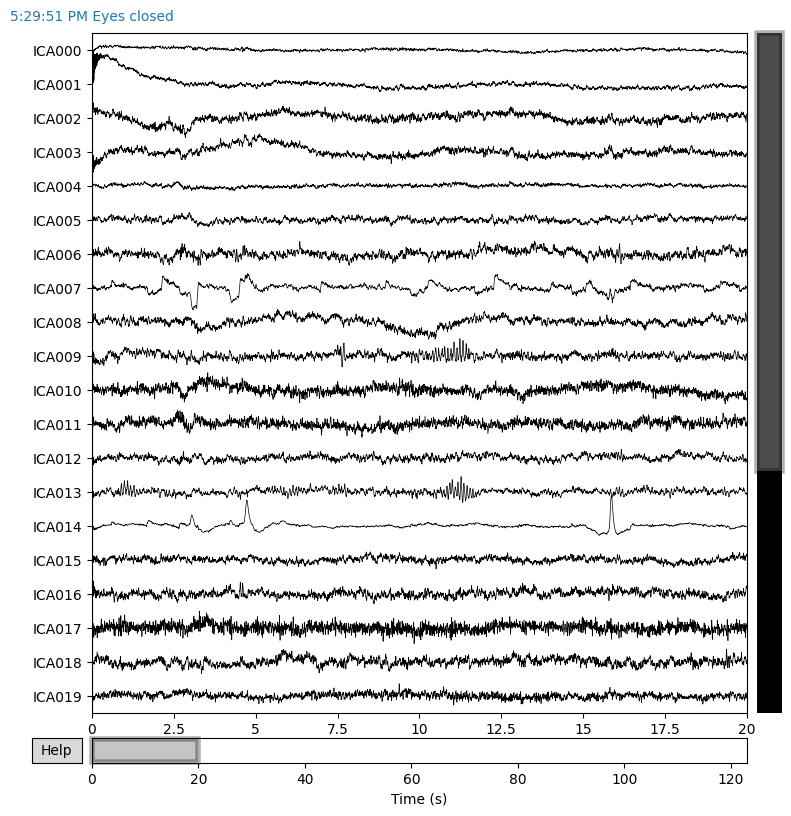

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\mne\viz\ica.py:128: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



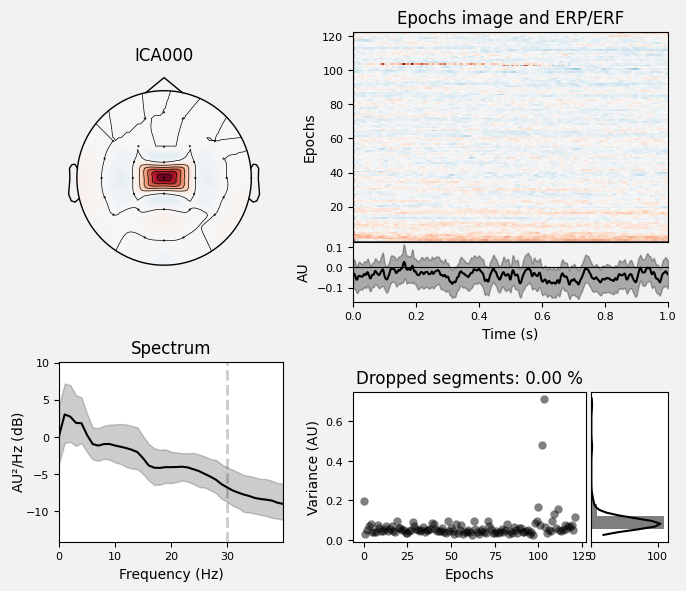

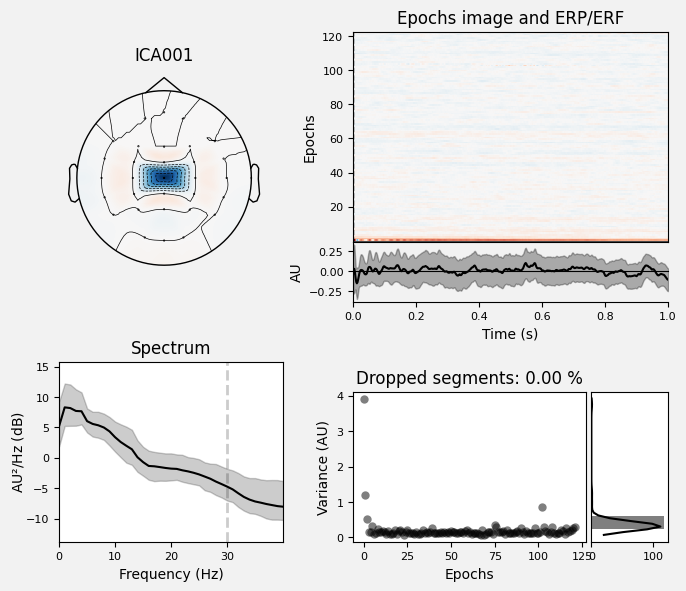

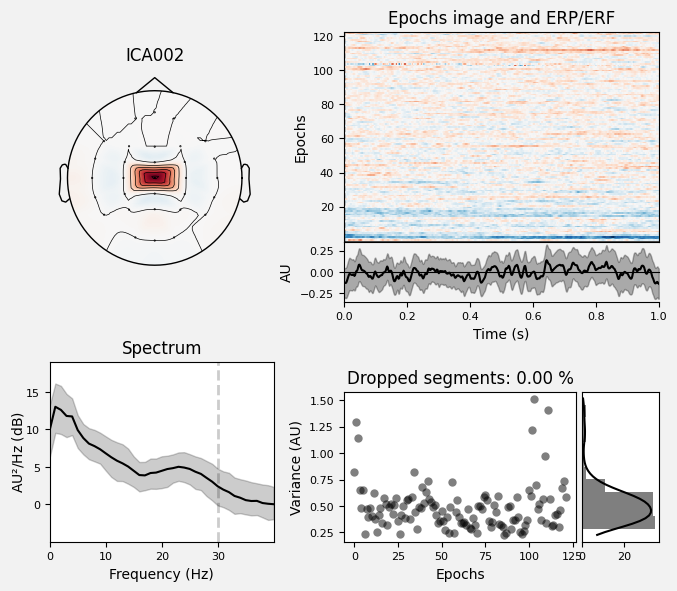

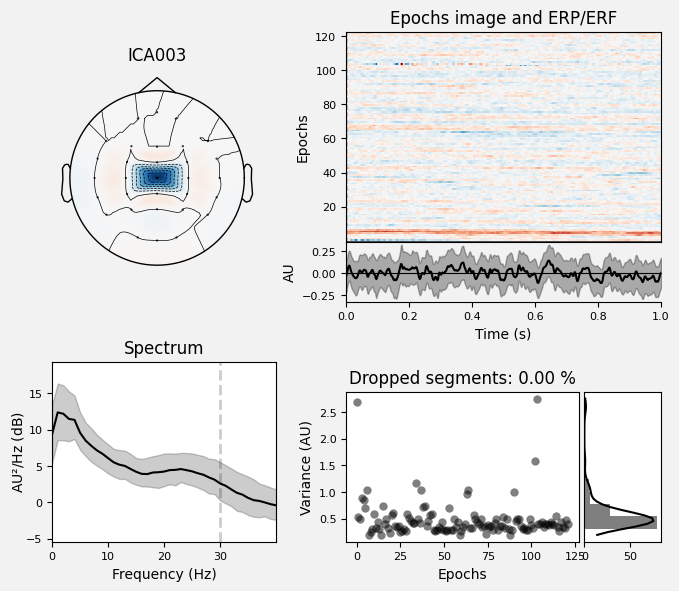

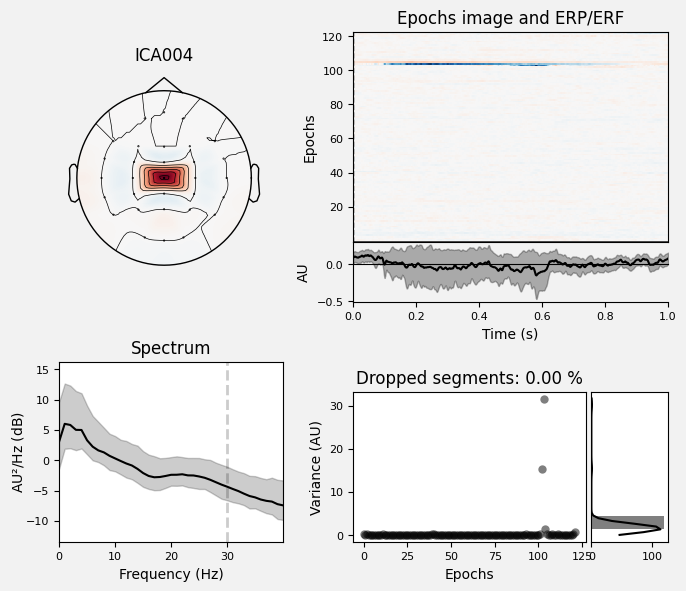

...

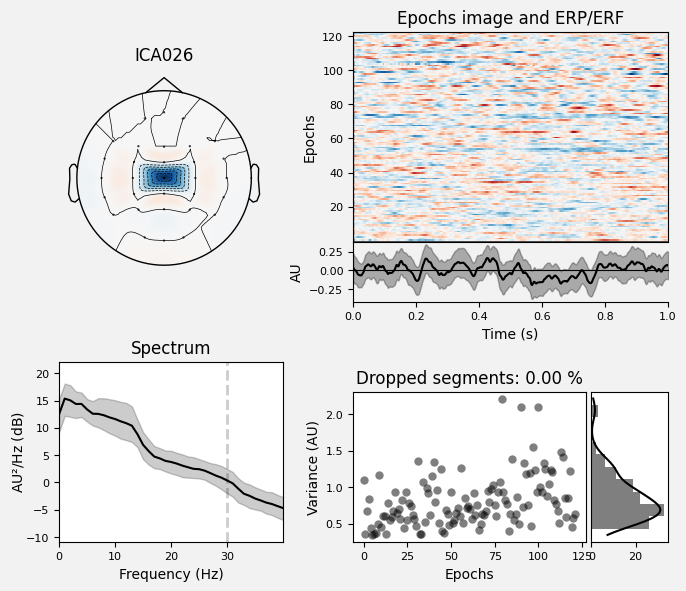

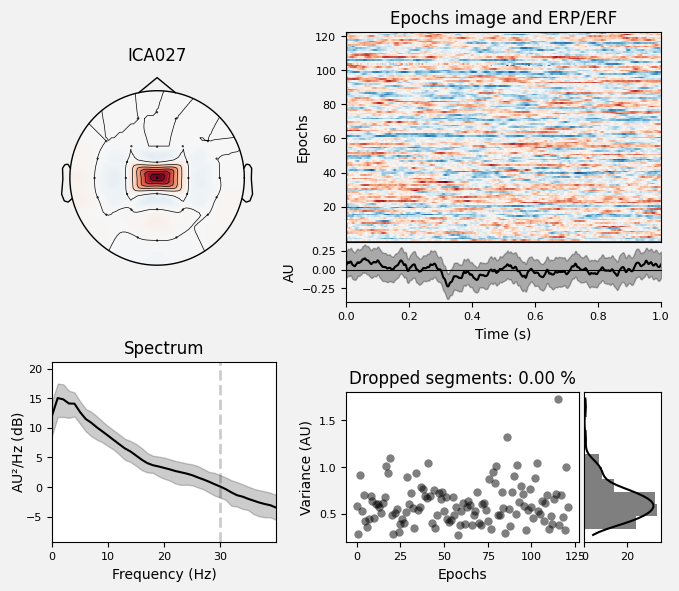

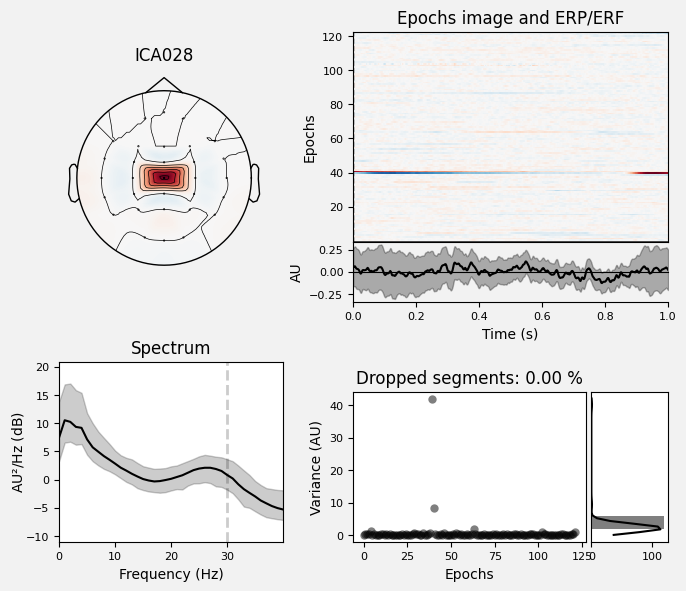

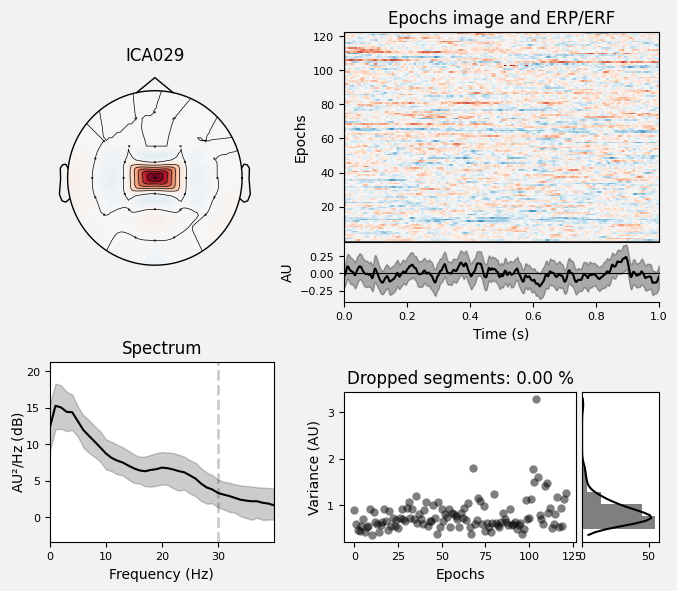

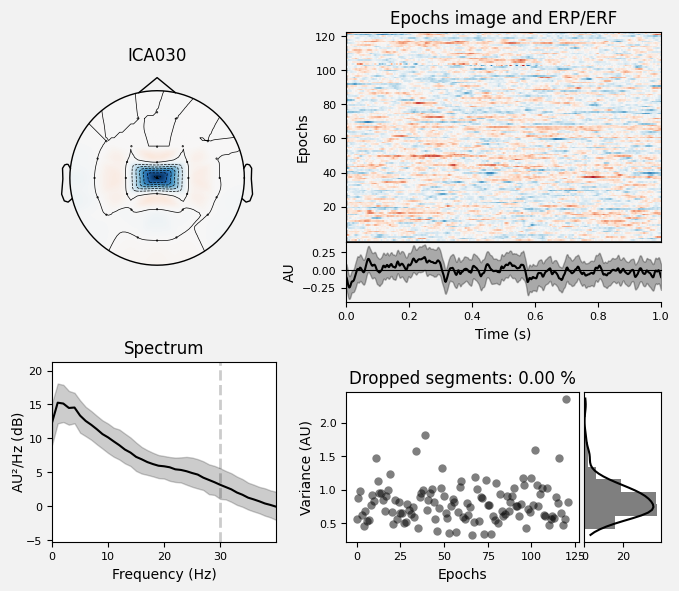

(39, 61500)
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
../data/raw/Dataset_1/All Participants\S3_\S3-Pre-Assessment\S3-pre_EC1.edf
[]

(31, 63500)
['F7', 'FT7', 'T3', 'TP7', 'T5', 'Fp1', 'F3', 'FC3', 'C3', 'CP3', 'P3', 'O1', 'Fpz', 'Fz', 'FCz', 'Cz', 'CPz', 'Pz', 'Oz', 'Fp2', 'F4', 'FC4', 'C4', 'CP4', 'P4', 'O2', 'F8', 'FT8', 'T4', 'TP8', 'T6']
Estimating rejection dictionary for eeg


C:\Users\bekar\AppData\Local\Temp\ipykernel_16944\484402278.py:41: RuntimeWarning:

The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject



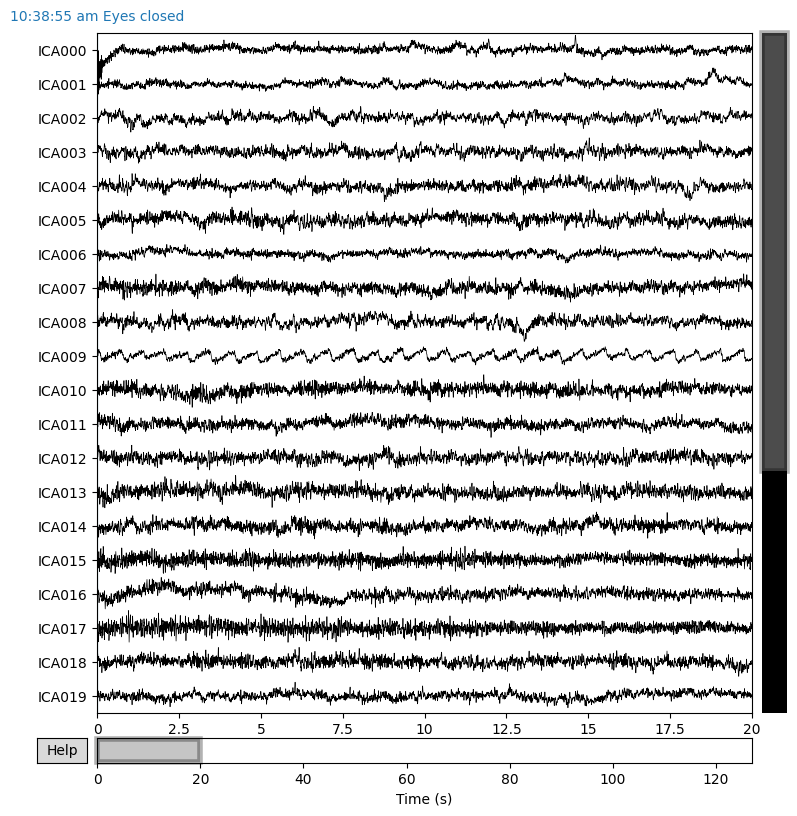

d:\Downloads\DTU\semester 4\thesis\thesis_venv\lib\site-packages\mne\viz\ica.py:128: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



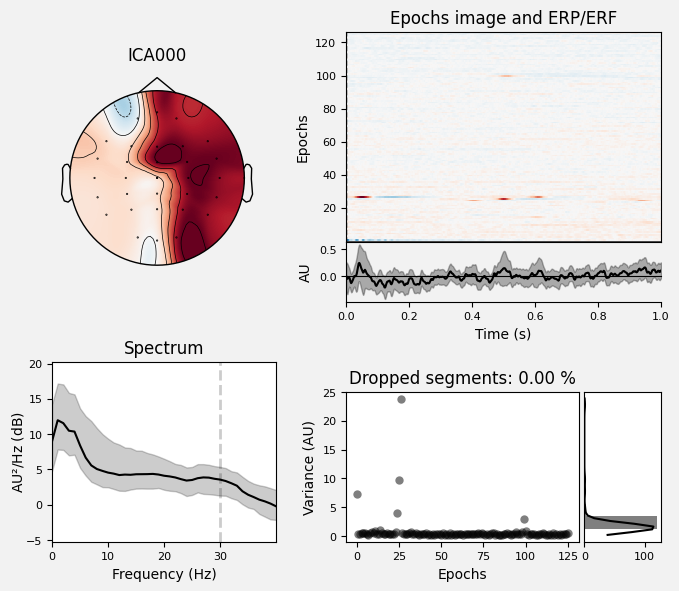

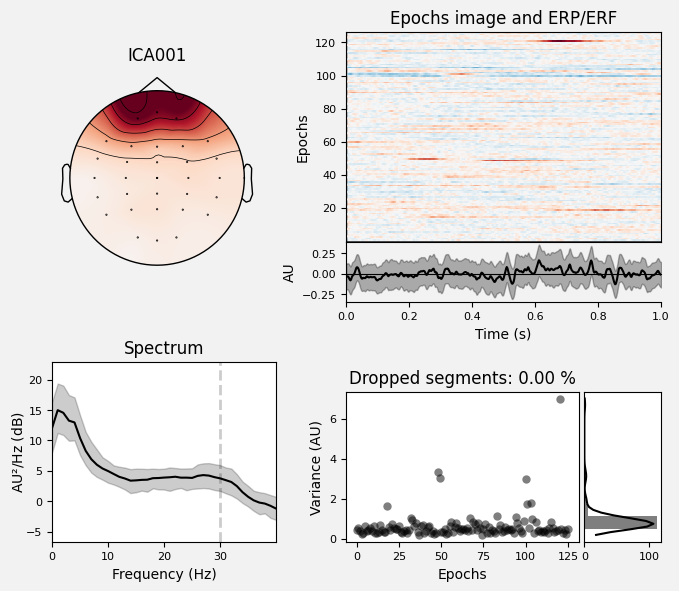

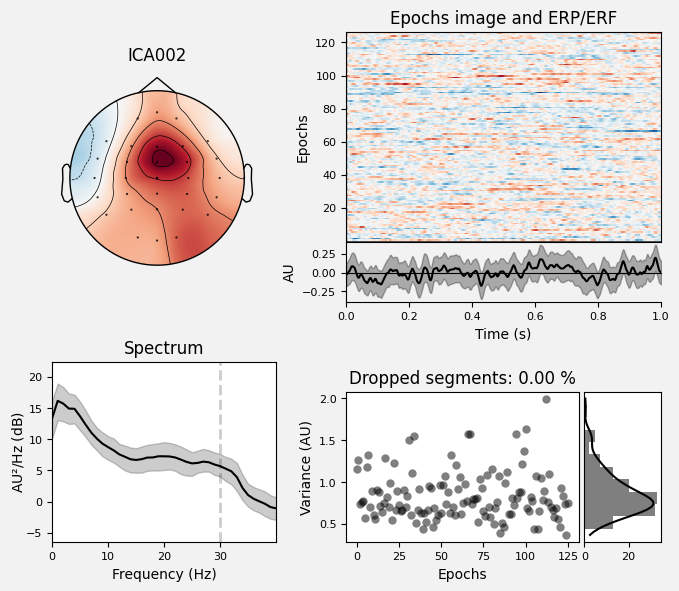

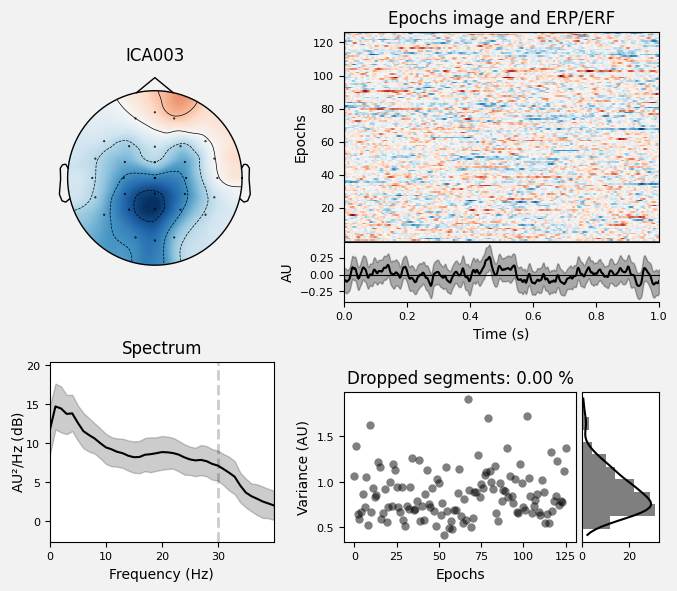

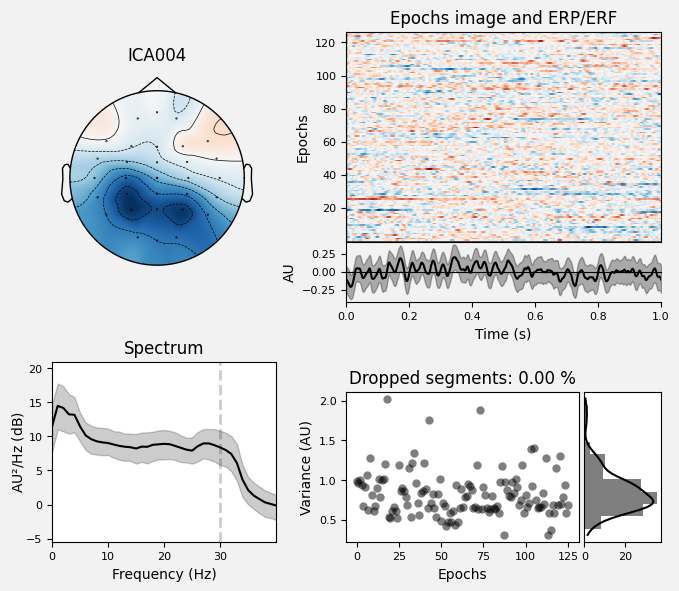

...

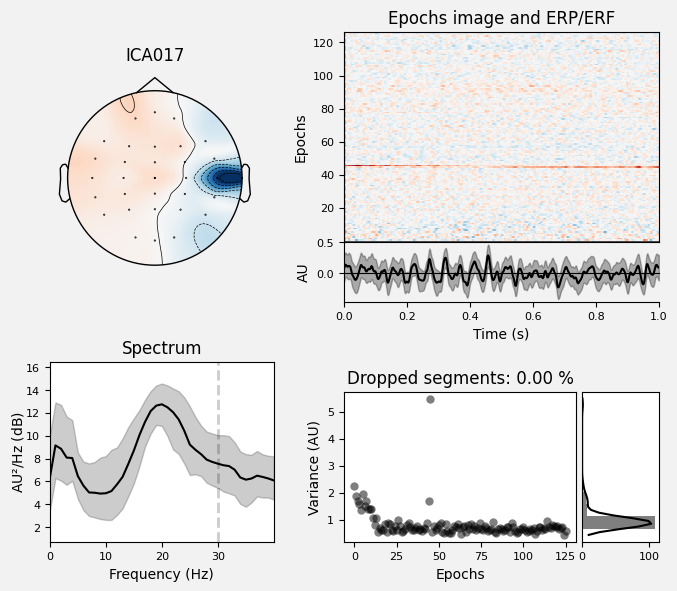

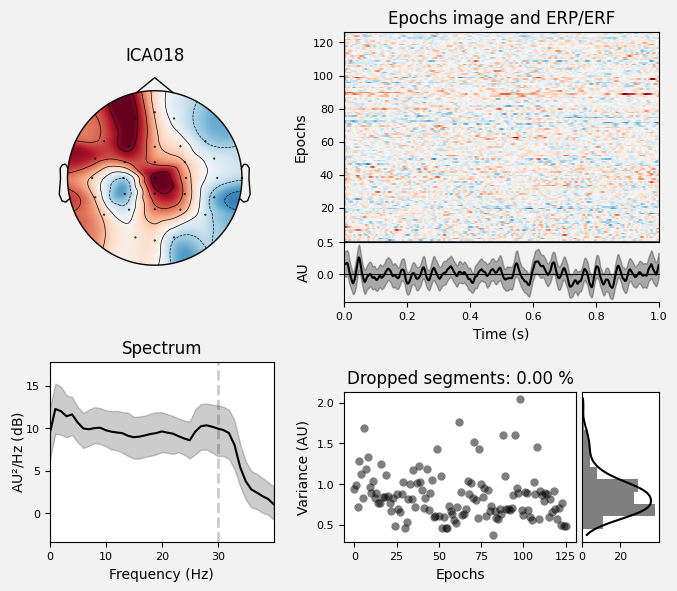

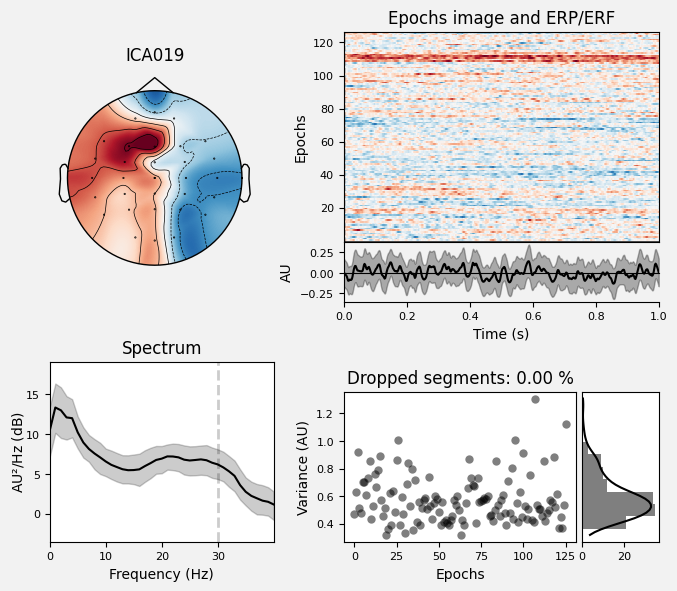

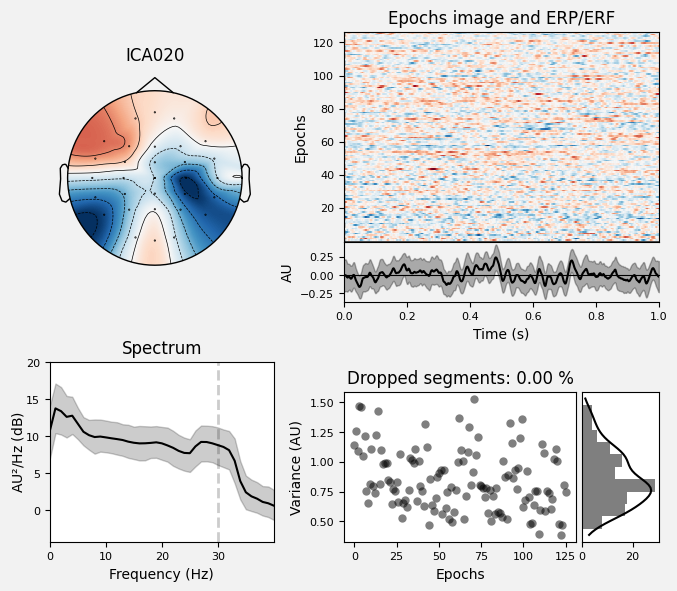

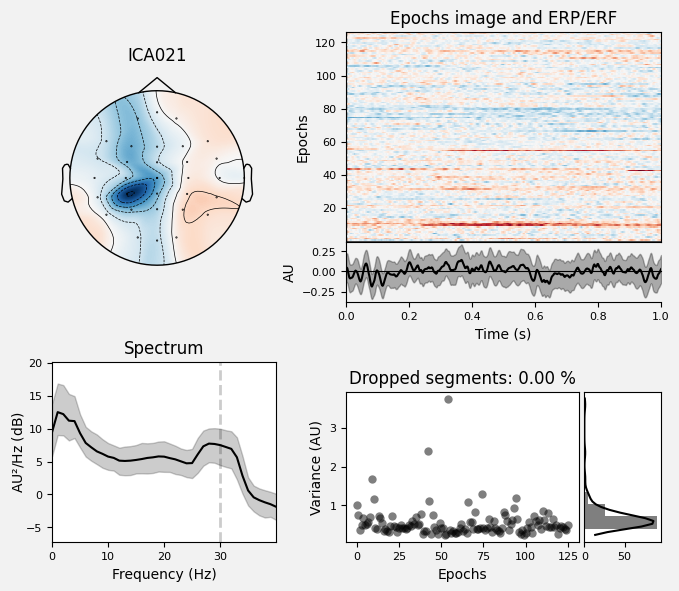

KeyboardInterrupt: 

In [32]:
def remove_noisy_data(filelist, config):
    noisy_recs = config['noisy_recs']
    filelist = [x for x in filelist if Path(x).stem not in noisy_recs]
    return filelist

all_files = glob.glob('../data/raw/Dataset_1/All Participants//**/*.edf', recursive=True)
all_files = remove_noisy_data(all_files, config)

mne.set_log_level(False)
for files in all_files:
    raw = mne.io.read_raw_edf(files, preload=True);
    raw = rename_channels(raw)
    if raw.info['ch_names'][:-1]==config['ch_names1']:
        print(True)
    else:
        print(files)
        bad_channels = list(set(raw.info['ch_names'][:-1]) - set(config['ch_names1']))
        print(bad_channels)
        raw.info['bads'].extend(bad_channels)
        #raw = mne.pick_types(raw.info, meg=False, eeg=True)
        print()
        print(raw.get_data(picks=config['ch_names1']).shape)
        print(raw.info['ch_names'][:-1])
        layout = read_montage()
        raw.set_montage(layout, on_missing = 'ignore');
        perform_ica(raw)
        print(raw.get_data().shape)